# Deep Visual-Semantic Embedding Models for Mobile (baseline)

The project implements a deep visual-semantic model based on Squeezenet 1.1 architecture and trained with fastText word vectors. The model takes in image input and provides a 300-D image feature vector output. Using efficient cross-platform similarity search library such as nmslib, the output feature vector can be used for image similarity search in model predictions, or for label prediction based on lookup of the nearest fastText word vector representation for the known image labels in dataset. The model can also be generalized for zero-shot use cases by performing nearest neighbor search in model predictions for the fastText word vector representation of the input text label.

In this jupyter notebook, **Resnet34** model architecture is used to do baseline comparison with Squeezenet 1.1

Ensure any edits to libraries are reloaded here automatically. Use `matplotlib inline` to display any charts or images inline in the notebook.

In [3]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

Import fastai packages. Use [fastai V1 library](http://www.fast.ai/2018/10/02/fastai-ai/) which sits on top of [Pytorch 1.0](https://hackernoon.com/pytorch-1-0-468332ba5163). The fastai library provides many useful functions which enable quick and easy building of neural networks and training models.

In [4]:
from fastai import *
from fastai.vision import *
from fastai.callbacks import *

In [5]:
assert (torch.cuda.is_available()), "GPU is not available!"

Import fastText library. fastText is used for efficient learning of word representations and sentence classification. Pretrained word vectors 300-D, trained using fastText are used.

wiki-news-300d-1M.vec.zip: 1 million word vectors trained on Wikipedia 2017, UMBC webbase corpus and statmt.org news dataset (16B tokens).

In [6]:
import fastText as ft

Batchsize is critical when training models. On my system (gpu: GTX 1080 ti, ram: 2*16 GB) with bs = 32, it would quickly run out of memory!

In [7]:
bs = 16

## 1. Exploring AWA2 dataset

AWA2 (Animals with Attributes) is a benchmark dataset for transfer learning algorithms such as zero-shot learning. It consists of 37322 images of 50 animals. The images in the dataset are in JPEG format.

The data is in the following format:
```
path/
    JPEGImages\
        antelope\
            antelope_10001.jpg
            antelope_10002.jpg
            ...
        bobcat\
            bobcat_10001.jpg
            bobcat_10002.jpg
            ...
        .
        .
        .
        classes.txt
```
**classes.txt** contains namess of all the 50 animal categories, one per line.

**trainclasses.txt** contains names of 40 animal categories (one per line) to be used for training/ validation. Train:valid split is 90:10.

**testclasses.txt** contains names of 10 animal categories (one per line),to be used for zero-shot tests.

In [8]:
path = Path(f'/home/nik/data/Animals_with_Attributes2'); path

PosixPath('/home/nik/data/Animals_with_Attributes2')

In [9]:
train_fnames = get_image_files(path/'train/antelope')
train_fnames[:5]

[PosixPath('/home/nik/data/Animals_with_Attributes2/train/antelope/antelope_10465.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/train/antelope/antelope_11004.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/train/antelope/antelope_10482.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/train/antelope/antelope_10898.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/train/antelope/antelope_11036.jpg')]

In [10]:
valid_fnames = get_image_files(path/'valid/antelope')
valid_fnames[:5]

[PosixPath('/home/nik/data/Animals_with_Attributes2/valid/antelope/antelope_10172.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/valid/antelope/antelope_10394.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/valid/antelope/antelope_10467.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/valid/antelope/antelope_10767.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/valid/antelope/antelope_10756.jpg')]

In [11]:
train_classes = list(loadtxt_str(path/'trainclasses.txt'))
train_classes

['antelope',
 'grizzly+bear',
 'killer+whale',
 'beaver',
 'dalmatian',
 'horse',
 'german+shepherd',
 'blue+whale',
 'siamese+cat',
 'skunk',
 'mole',
 'tiger',
 'moose',
 'spider+monkey',
 'elephant',
 'gorilla',
 'ox',
 'fox',
 'sheep',
 'hamster',
 'squirrel',
 'rhinoceros',
 'rabbit',
 'bat',
 'giraffe',
 'wolf',
 'chihuahua',
 'weasel',
 'otter',
 'buffalo',
 'zebra',
 'deer',
 'bobcat',
 'lion',
 'mouse',
 'polar+bear',
 'collie',
 'walrus',
 'cow',
 'dolphin']

In [12]:
test_classes = list(loadtxt_str(path/'testclasses.txt'))
test_classes

['chimpanzee',
 'giant+panda',
 'leopard',
 'persian+cat',
 'pig',
 'hippopotamus',
 'humpback+whale',
 'raccoon',
 'rat',
 'seal']

Create dataframe with `train` and `valid` columns containing number of images corresponding to each image category. Use class names as `index`.

In [13]:
train_list = [len(get_image_files(path/'train'/cls)) for cls in train_classes]
valid_list = [len(get_image_files(path/'valid'/cls)) for cls in train_classes]
df = pd.DataFrame({'train':train_list, 'valid': valid_list}, index=train_classes)

In [14]:
df = df.sort_values(by='train', ascending=False)
df

,train,valid
horse,1481,164
sheep,1278,142
deer,1210,134
cow,1205,133
giraffe,1082,120
squirrel,1080,120
zebra,1053,117
rabbit,980,108
antelope,942,104
elephant,935,103


In [15]:
df['train'].sum()

27322

In [16]:
df['valid'].sum()

3015

In [17]:
import matplotlib
matplotlib.rcParams.update({'font.size':12})

Text(0,0.5,'Number of images per class')

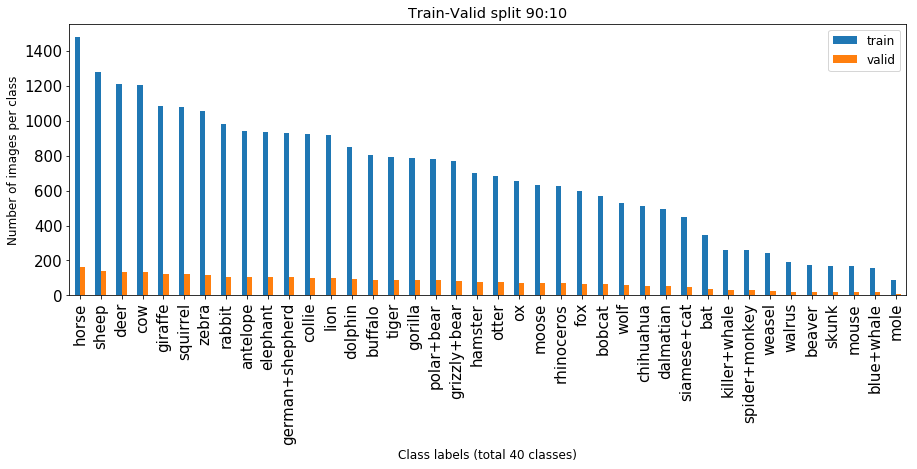

In [18]:
ax = df.plot.bar(rot=90, figsize=(15,5), fontsize=15, title="Train-Valid split 90:10")
ax.set_xlabel("Class labels (total 40 classes)")
ax.set_ylabel("Number of images per class")

In [19]:
test_list = [len(get_image_files(path/'test'/cls)) for cls in test_classes]
df_test = pd.DataFrame({'test':test_list}, index=test_classes)

Text(0,0.5,'Number of images per class')

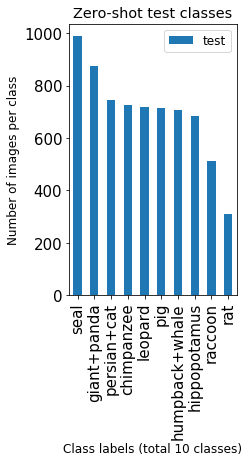

In [20]:
df_test = df_test.sort_values(by='test', ascending=False)
ax = df_test.plot.bar(rot=90, figsize=(3,5), fontsize=15, title="Zero-shot test classes")
ax.set_xlabel("Class labels (total 10 classes)")
ax.set_ylabel("Number of images per class")

In [21]:
df_test['test'].sum()


6985

# 2. Stage-1 Train a CNN for multi-class classification

## 2.1 Dataloader and Data Augmentation

Fastai provides convenience methods to create `DataBunch` objects which can be used for training a classifier.

With `get_transforms()`, fastai applies a bunch of transforms (pixel and co-ordinate - flip, rotate, warp, zoom, lighting transforms) in an optimized way. The `get_transforms()` function returns a tuple of two list of transforms, one for the training set and the other for the validation set(limited to center crop by default).

In [22]:
data = ImageDataBunch.from_folder(path, ds_tfms=get_transforms(), size=224, bs=bs)
data.normalize(imagenet_stats)

ImageDataBunch;

Train: LabelList
y: CategoryList (27322 items)
[Category beaver, Category beaver, Category beaver, Category beaver, Category beaver]...
Path: /home/nik/data/Animals_with_Attributes2
x: ImageItemList (27322 items)
[Image (3, 640, 960), Image (3, 768, 1024), Image (3, 375, 500), Image (3, 683, 1024), Image (3, 680, 1024)]...
Path: /home/nik/data/Animals_with_Attributes2;

Valid: LabelList
y: CategoryList (3015 items)
[Category beaver, Category beaver, Category beaver, Category beaver, Category beaver]...
Path: /home/nik/data/Animals_with_Attributes2
x: ImageItemList (3015 items)
[Image (3, 682, 1024), Image (3, 680, 1024), Image (3, 576, 1024), Image (3, 681, 1024), Image (3, 800, 800)]...
Path: /home/nik/data/Animals_with_Attributes2;

Test: None

In [23]:
xb,yb = data.one_batch()
xb.shape, yb.shape

(torch.Size([16, 3, 224, 224]), torch.Size([16]))

To take a peek at the images inside a batch, use `ImageDataBunch.show_batch`, _rows_ argument indicates number of rows and columns to display.

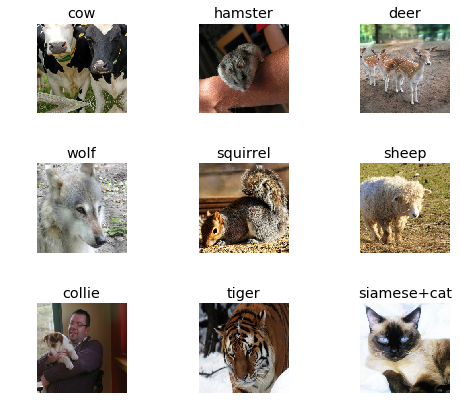

In [24]:
data.show_batch(rows=3, figsize=(7,6))

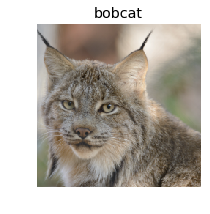

In [30]:
x,y = data.train_ds[1226]
x.show(y=y)

Display **Image Transforms** for an image in training dataset (train_ds)

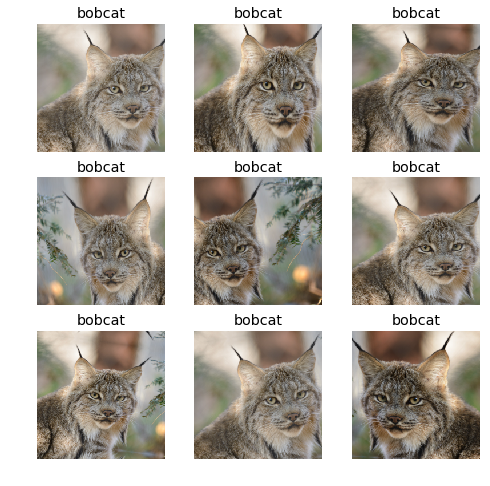

In [27]:
def _plot(i, j, ax):
    x, y = data.train_ds[1226]
    x.show(ax, y=y)
plot_multi(_plot, 3, 3, figsize=(8, 8))

In [31]:
print(data.classes)
len(data.classes),data.c # data.c contains the number of classes of the data

['antelope', 'bat', 'beaver', 'blue+whale', 'bobcat', 'buffalo', 'chihuahua', 'collie', 'cow', 'dalmatian', 'deer', 'dolphin', 'elephant', 'fox', 'german+shepherd', 'giraffe', 'gorilla', 'grizzly+bear', 'hamster', 'horse', 'killer+whale', 'lion', 'mole', 'moose', 'mouse', 'otter', 'ox', 'polar+bear', 'rabbit', 'rhinoceros', 'sheep', 'siamese+cat', 'skunk', 'spider+monkey', 'squirrel', 'tiger', 'walrus', 'weasel', 'wolf', 'zebra']


(40, 40)

In [32]:
len(data.train_ds), len(data.valid_ds)

(27322, 3015)

## Model Training: resnet34

### Stage 1a: Freeze backbone, train only the custom head

Fastai uses [convolutional neural network](http://cs231n.github.io/convolutional-networks/) backbone and a fully connected head with a single hidden layer as a classifier. The idea here is the model will take images as input and will output the predicted probability for each of the 40 categories.

This method creates a `Learner` object from the passed `DataBunch` object and backbone provided in the `arch`. It also cuts the model defined by 'arch' at the last convolutional layer by default. Add two linear layers (out = 512, 300) in the custom head before the output layer. 

Use `accuracy` performance metric. Add a final batch normalization layer (bn_final is true). Dropout regularization will be used, dropout p=0.5 for final layer and p=0.25 for remaining layers.

In [35]:
learn = create_cnn(data, models.resnet34, metrics=accuracy, lin_ftrs = [512,300], bn_final = True, callback_fns=[BnFreeze, ShowGraph])

In [27]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

In [28]:
learn.summary()

Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [16, 64, 112, 112]   9408       False     
______________________________________________________________________
BatchNorm2d          [16, 64, 112, 112]   128        True      
______________________________________________________________________
ReLU                 [16, 64, 112, 112]   0          False     
______________________________________________________________________
MaxPool2d            [16, 64, 56, 56]     0          False     
______________________________________________________________________
Conv2d               [16, 64, 56, 56]     36864      False     
______________________________________________________________________
BatchNorm2d          [16, 64, 56, 56]     128        True      
______________________________________________________________________
ReLU                 [16, 64, 56, 56]     0          False     
______________________________________________________________

Model summary: 
Total params:  21979164,
Total trainable params:  711516,
Total non-trainable params:  21267648

Use lr_find() to launch mock training using learning rate between 1e-07 to 10 over 100 iterations (default values). 

In [29]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Plot the losses against the learning rates. Choose a learning rate where loss still improves.

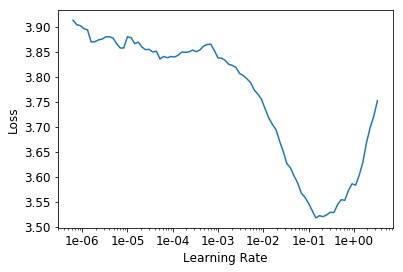

In [30]:
learn.recorder.plot()

Add a callback to the `Learner` object for early stopping. The callback is used to monitor `accuracy` for maximum value and will stop training after `patience` epochs if it hasn't improved by `min_delta`

In [31]:
learn.callback_fns.append(partial(EarlyStoppingCallback, monitor='accuracy', min_delta=0.001, patience=1))

Launch training using 1 cycle policy for 5 epochs!

epoch,train_loss,valid_loss,accuracy
1,1.037113,0.344264,0.901824
2,0.793828,0.292928,0.915423
3,0.614806,0.235631,0.933997
4,0.468486,0.199180,0.941957
5,0.424877,0.193295,0.944279


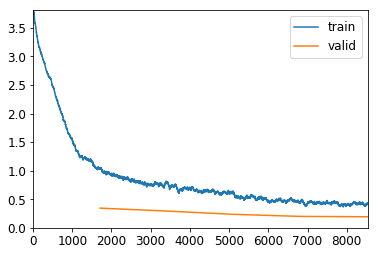

In [32]:
learn.fit_one_cycle(5, max_lr=slice(1e-2))

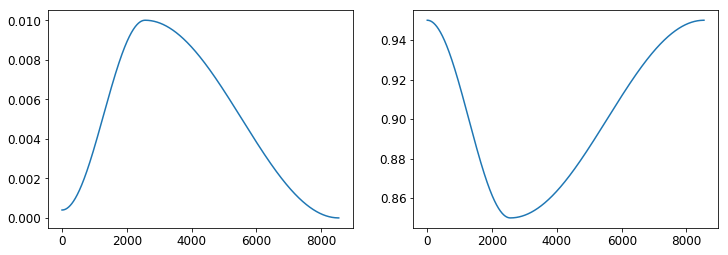

In [33]:
learn.recorder.plot_lr(show_moms=True)

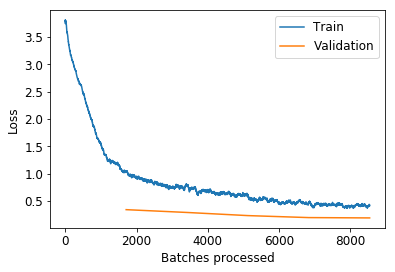

In [34]:
learn.recorder.plot_losses()

### Save the model

In [35]:
learn.save('resnet34-awa2-stage-1a')

### Stage 1b: Unfreeze and fine-tune

*unfreeze* the layers in the model backbone and train entire model using differential learning rates.

In [37]:
learn.unfreeze()

In [37]:
learn.summary()

Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [16, 64, 112, 112]   9408       True      
______________________________________________________________________
BatchNorm2d          [16, 64, 112, 112]   128        True      
______________________________________________________________________
ReLU                 [16, 64, 112, 112]   0          False     
______________________________________________________________________
MaxPool2d            [16, 64, 56, 56]     0          False     
______________________________________________________________________
Conv2d               [16, 64, 56, 56]     36864      True      
______________________________________________________________________
BatchNorm2d          [16, 64, 56, 56]     128        True      
______________________________________________________________________
ReLU                 [16, 64, 56, 56]     0          False     
______________________________________________________________

Model summary:

Total params:  21979164
Total trainable params:  21979164
Total non-trainable params:  0

In [38]:
learn.callback_fns.pop()

functools.partial(<class 'fastai.callbacks.tracker.EarlyStoppingCallback'>, monitor='accuracy', min_delta=0.001, patience=1)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


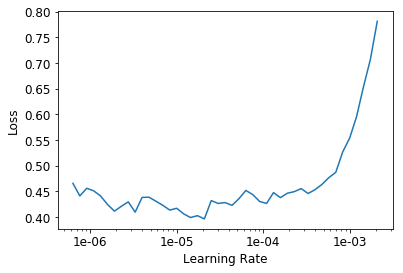

In [38]:
learn.lr_find()
learn.recorder.plot()

In [40]:
learn.callback_fns.append(partial(EarlyStoppingCallback, monitor='accuracy', min_delta=0.001, patience=1))

epoch,train_loss,valid_loss,accuracy
1,0.379758,0.188478,0.944279
2,0.389818,0.177393,0.948590
3,0.326156,0.173437,0.952570


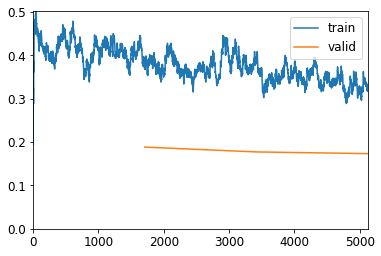

In [41]:
learn.fit_one_cycle(3, max_lr=slice(1e-6, 1e-4))

Model Accuracy is 95.26%

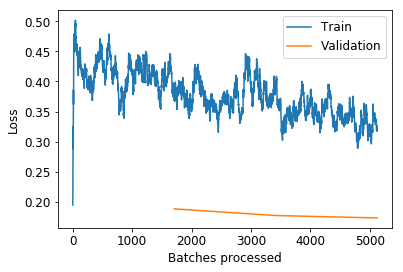

In [42]:
learn.recorder.plot_losses()

In [43]:
learn.freeze()

### Save the model

In [44]:
learn.save('resnet34-awa2-stage-1b')

## 2.3 CNN Results

`from_learner` is a factory method to instantiate `ClassificationInterpretation` which provides a confusion matrix and visualization for misclassified images. It uses the dev set and does not do any test time augmentation by default.

In [45]:
interpret = ClassificationInterpretation.from_learner(learn)

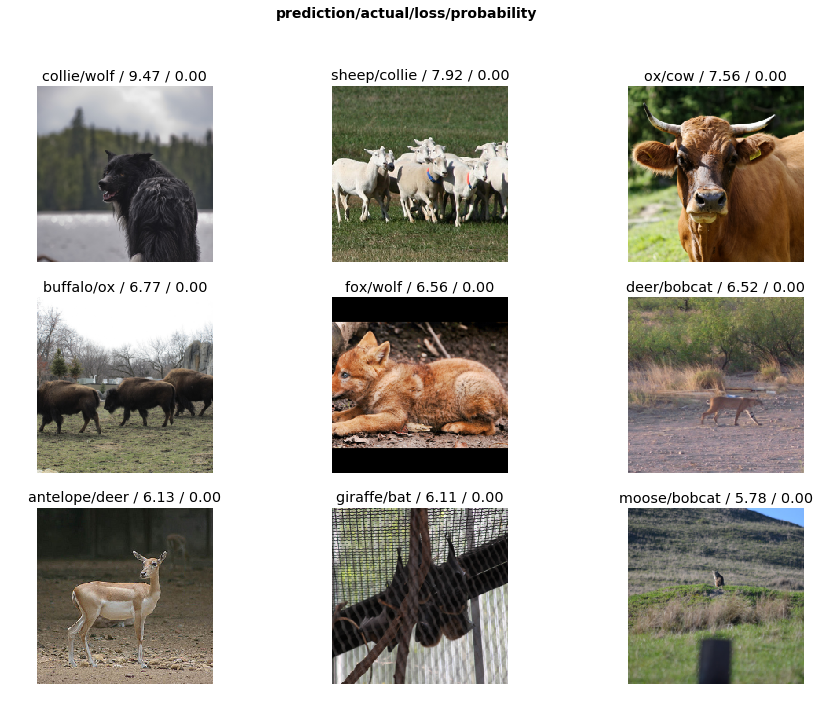

In [46]:
interpret.plot_top_losses(9, figsize=(15,11))

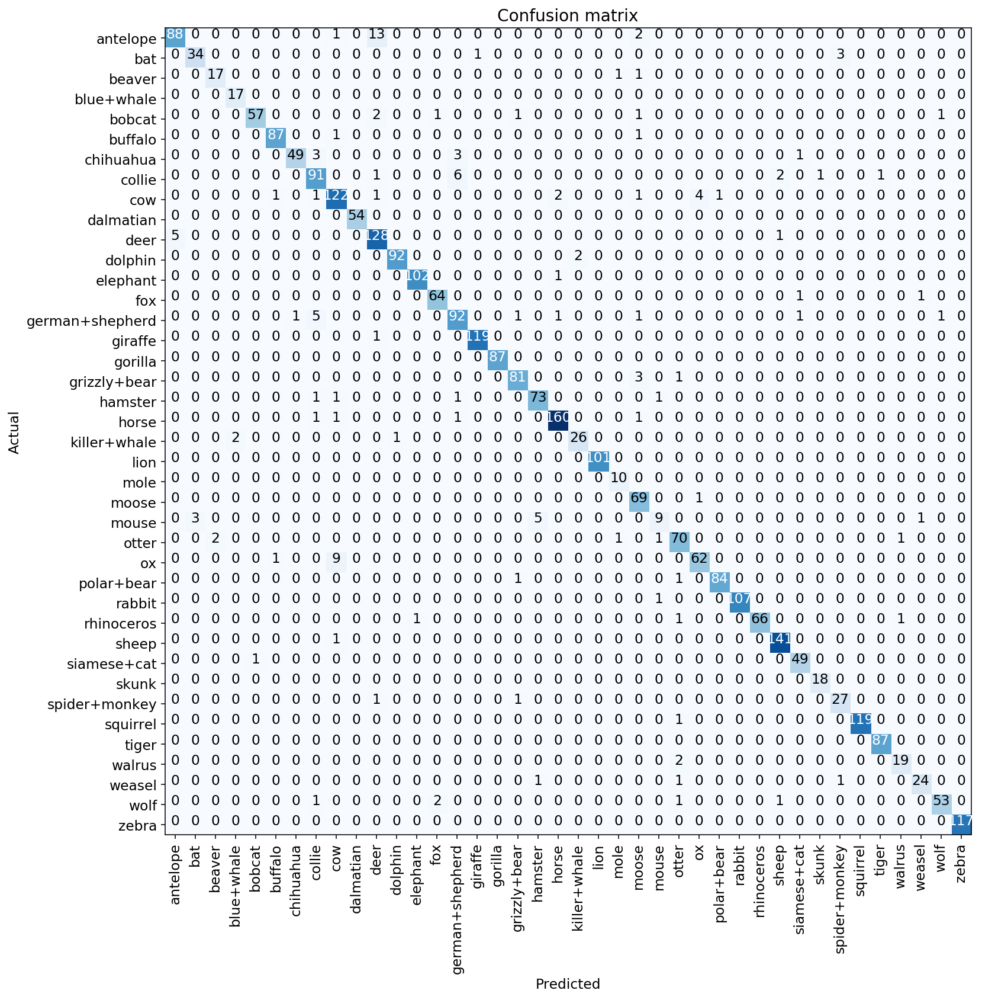

In [47]:
interpret.plot_confusion_matrix(figsize=(12,12), dpi=140)

In [48]:
interpret.most_confused(min_val=2)

[('antelope', 'deer', 13),
 ('ox', 'cow', 9),
 ('collie', 'german+shepherd', 6),
 ('deer', 'antelope', 5),
 ('german+shepherd', 'collie', 5),
 ('mouse', 'hamster', 5),
 ('cow', 'ox', 4),
 ('bat', 'spider+monkey', 3),
 ('chihuahua', 'collie', 3),
 ('chihuahua', 'german+shepherd', 3),
 ('grizzly+bear', 'moose', 3),
 ('mouse', 'bat', 3)]

Plotting the confusion matrix helps identify which categories were confused with other categories and how often!

In [49]:
top_losses, top_loss_indexes = interpret.top_losses(9)

In [50]:
top_loss_indexes

tensor([1785, 2420, 2519, 2658, 1758,   97,  905, 1704,   96])

In [51]:
min_losses, min_loss_indexes = interpret.top_losses(9, largest=False)

In [52]:
def show_images(indexes):
    images = [data.valid_ds[i][0] for i in indexes]
    labels = [data.valid_ds[i][1] for i in indexes]
    for i,ax in plot_flat(3, 3, figsize=(8,8)):
        images[i].show(ax, y=labels[i])

In [53]:
m = learn.model.eval()
def hooked_backward(x):
    with hook_output(m[0]) as hook_a: 
            preds = m(x)
    return hook_a

In [54]:
def plt_heatmap(acts, images, labels):
    for i,ax in plot_flat(3, 3, figsize=(8,8)):
        images[i].show(ax, y=labels[i])
        ax.imshow(acts[i], alpha=0.6, extent=(0,224,224,0),
              interpolation='bilinear', cmap='magma')

In [55]:
def show_heatmap(indexes):
    images = []
    activations =[]
    labels= []
    for idx in indexes:
        xl, yl = data.valid_ds[idx]
        xlb, _ = data.one_item(xl)
        xl_img = Image(data.denorm(xlb)[0])
        images.append(xl_img)
        labels.append(yl)
        hooka = hooked_backward(xlb)
        activations.append(hooka.stored[0].mean(0))
    plt_heatmap(activations, images, labels)

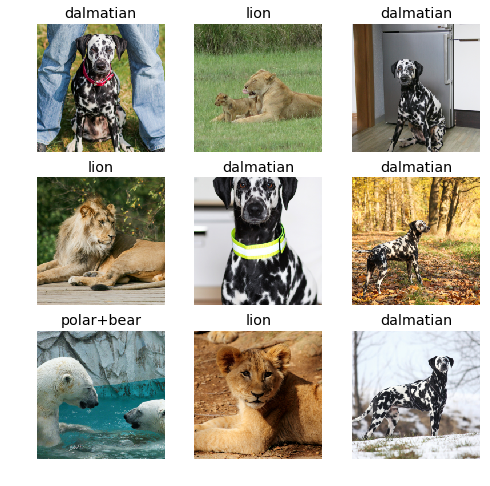

In [56]:
show_images(min_loss_indexes)

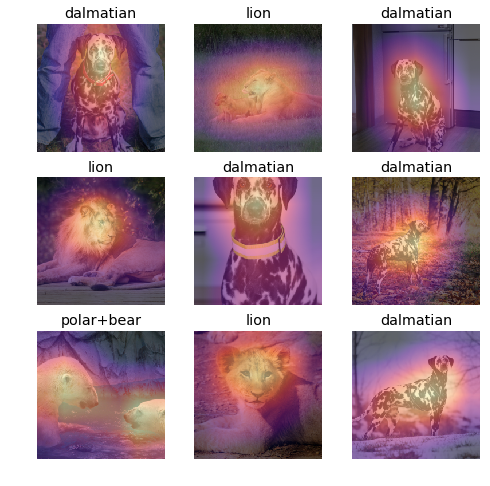

In [57]:
show_heatmap(min_loss_indexes)

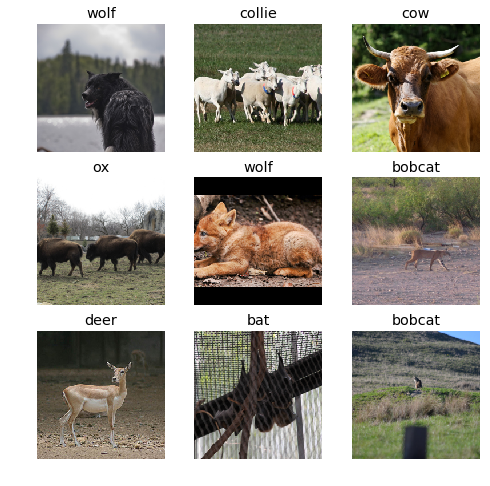

In [58]:
show_images(top_loss_indexes)

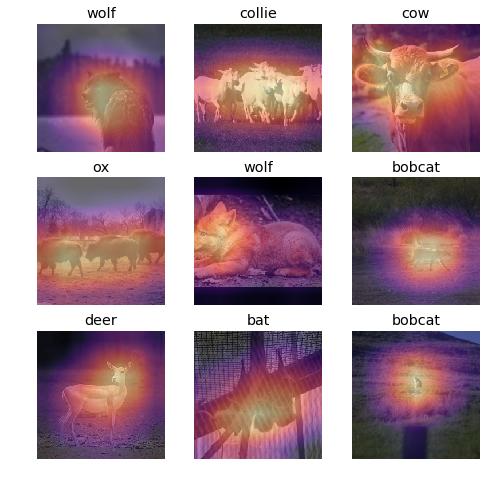

In [59]:
show_heatmap(top_loss_indexes)

## 3. Using FastText

In [43]:
ft_path = Path(f'/home/nik/data/wiki.en.bin'); ft_path

PosixPath('/home/nik/data/wiki.en.bin')

In [44]:
fastText_vec = ft.load_model(str(('/home/nik/data/wiki.en.bin')))

In [62]:
np.corrcoef(fastText_vec.get_word_vector('antelope'), fastText_vec.get_word_vector('deer'))

array([[1.      , 0.616253],
       [0.616253, 1.      ]])

In [63]:
np.corrcoef(fastText_vec.get_word_vector('antelope'), fastText_vec.get_word_vector('tiger'))

array([[1.      , 0.330561],
       [0.330561, 1.      ]])

In [45]:
awa2_classes40_list = [l.replace("+", "_") for l in list(loadtxt_str(path/'trainclasses.txt'))]
print(awa2_classes40_list)

awa2_wv = {w:fastText_vec.get_word_vector(w) for w in awa2_classes40_list}
len(awa2_wv)

['antelope', 'grizzly_bear', 'killer_whale', 'beaver', 'dalmatian', 'horse', 'german_shepherd', 'blue_whale', 'siamese_cat', 'skunk', 'mole', 'tiger', 'moose', 'spider_monkey', 'elephant', 'gorilla', 'ox', 'fox', 'sheep', 'hamster', 'squirrel', 'rhinoceros', 'rabbit', 'bat', 'giraffe', 'wolf', 'chihuahua', 'weasel', 'otter', 'buffalo', 'zebra', 'deer', 'bobcat', 'lion', 'mouse', 'polar_bear', 'collie', 'walrus', 'cow', 'dolphin']


40

In [65]:
awa2_wv

{'antelope': array([-0.107355,  0.212998, -0.406771,  0.645497, ..., -0.033072,  0.281095,  0.217933, -0.251198], dtype=float32),
 'bat': array([-0.383963, -0.17499 ,  0.27971 ,  0.432508, ..., -0.256876,  0.085564,  0.181721,  0.598115], dtype=float32),
 'beaver': array([-0.225071, -0.15675 , -0.515855,  0.083625, ...,  0.283767,  0.181368, -0.053533, -0.19293 ], dtype=float32),
 'blue_whale': array([-0.268029, -0.070391,  0.183837,  0.394201, ..., -0.437844,  0.437025,  0.259449,  0.440447], dtype=float32),
 'bobcat': array([-0.38614 ,  0.151261, -0.392949,  0.150454, ...,  0.288971,  0.469168, -0.021795, -0.084231], dtype=float32),
 'buffalo': array([-0.199506, -0.164718, -0.224075,  0.50819 , ...,  0.045479,  0.224494, -0.171737, -0.075329], dtype=float32),
 'chihuahua': array([ 0.218249, -0.178664, -0.240226, -0.303855, ...,  0.008106,  0.34764 ,  0.343907, -0.457358], dtype=float32),
 'collie': array([ 0.199164, -0.026846, -0.107791,  0.335382, ..., -0.032095,  0.099093, -0.05681

Dict awa2_all_wv contains fastText word vectors as values for each of the 50 classes (key) in classes.txt

In [46]:
awa2_classes50_list = [l.replace("+", "_") for l in list(loadtxt_str(path/'classes.txt'))]

awa2_all_wv = {w:fastText_vec.get_word_vector(w) for w in awa2_classes50_list}
len(awa2_all_wv)

50

## 4. Stage-2 Train Visual-Semantic Model

## 4.1 Dataloader and Data Augmentation

In [47]:
valid_images = []
def get_labels(i):
    item = awa2_wv.get(i.parts[-2].replace("+", "_"))
    if(i.parts[-3] == 'valid'):
        valid_images.append(i)
    return item

In [48]:
data_combined = (ImageItemList.from_folder(path)
                 .split_by_folder()
                 .label_from_func(get_labels, label_cls=FloatList)
                 .transform(get_transforms(), size=224)
                 .databunch(bs=16))
data_combined.normalize(imagenet_stats)

ImageDataBunch;

Train: LabelList
y: FloatList (27322 items)
[FloatItem [-0.2250710278749466, -0.15674959123134613, -0.5158546566963196, 0.0836247056722641, -0.08332619071006775, -0.3474692702293396, 0.17878687381744385, -0.07311393320560455, 0.40145596861839294, 0.05146363005042076, 0.41777828335762024, 0.04084528237581253, 0.19948039948940277, -0.5551471710205078, 0.011590533889830112, 0.2590152323246002, -0.10557948052883148, 0.21340644359588623, -0.4609827697277069, 0.18470248579978943, -0.32966348528862, 0.46347105503082275, 0.03294726833701134, -0.10165330022573471, 0.23562383651733398, -0.007722075097262859, -0.1347125917673111, 0.16790570318698883, 0.06482983380556107, -0.37938830256462097, 0.0347742959856987, 0.44446277618408203, -0.5043357014656067, 0.1440601795911789, 0.1844012588262558, -0.11788546293973923, -0.0749538466334343, -0.30834364891052246, 0.3846855163574219, -0.30360764265060425, -0.1029171496629715, 0.1181022897362709, -0.3211665749549866, 0.5014338493347168, 0

In [69]:
data_combined.batch_size, data_combined.c

(16, 300)

In [70]:
len(valid_images)

3015

## 4.2 Model Training: Visual-Semantic model (Resnet34)

### Stage 2a: Freeze backbone, train only the custom head

Define **loss function** for the visual semantic model

In [49]:
def cos_loss(inp,targ): return 1 - F.cosine_similarity(inp,targ).mean()

Create a `Learner` object using `DataBunch` and `Resnet34` model arch. Load the model from previous stage (1b).

In [50]:
learn_combined = create_cnn(data, models.resnet34, lin_ftrs = [512,300], bn_final = True, callback_fns = [BnFreeze, ShowGraph]).load('resnet34-awa2-stage-1b')

In [76]:
learn_combined.summary()

Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [16, 64, 112, 112]   9408       False     
______________________________________________________________________
BatchNorm2d          [16, 64, 112, 112]   128        True      
______________________________________________________________________
ReLU                 [16, 64, 112, 112]   0          False     
______________________________________________________________________
MaxPool2d            [16, 64, 56, 56]     0          False     
______________________________________________________________________
Conv2d               [16, 64, 56, 56]     36864      False     
______________________________________________________________________
BatchNorm2d          [16, 64, 56, 56]     128        True      
______________________________________________________________________
ReLU                 [16, 64, 56, 56]     0          False     
______________________________________________________________

In [77]:
learn_combined.layer_groups

[Sequential(
   (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
   (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (2): ReLU(inplace)
   (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
   (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (6): ReLU(inplace)
   (7): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (9): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (11): ReLU(inplace)
   (12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (13): BatchNorm2d(64, eps=1e-05, momentum=0.1, affi

### Update layer groups to discard the softmax layers

In [51]:
learn_combined.split(lambda m:(m[0][6],m[1],m[1][11]))
learn_combined.layer_groups.pop()

Sequential(
  (0): Dropout(p=0.5)
  (1): Linear(in_features=300, out_features=40, bias=True)
  (2): BatchNorm1d(40, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
)

In [79]:
learn_combined.layer_groups

[Sequential(
   (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
   (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (2): ReLU(inplace)
   (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
   (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (6): ReLU(inplace)
   (7): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (9): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (11): ReLU(inplace)
   (12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
   (13): BatchNorm2d(64, eps=1e-05, momentum=0.1, affi

### Update data and loss function in `Learner` object

In [52]:
learn_combined.data = data_combined
learn_combined.loss_func = cos_loss

### Update model to discard the softmax layers

#### Debugger layer can be inserted optionally for debugging purposes

In [53]:
model_combined = []
#model_children = list(learn_combined.model.children())
model_children = children(learn_combined.model)

#model_children_1 = list(model_children[1])
#model_children_1 = model_children_1[:-4]
#model_children_1.insert(8, Debugger())

model_combined.append(model_children[0])
#model_combined.append(nn.Sequential(*model_children_1))

model_children[1][9] = model_children[1][10] #replace Relu with BN layer
model_combined.append(model_children[1][:-4])

learn_combined.model = nn.Sequential(*model_combined)

In [82]:
learn_combined.summary()

Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [16, 64, 112, 112]   9408       False     
______________________________________________________________________
BatchNorm2d          [16, 64, 112, 112]   128        True      
______________________________________________________________________
ReLU                 [16, 64, 112, 112]   0          False     
______________________________________________________________________
MaxPool2d            [16, 64, 56, 56]     0          False     
______________________________________________________________________
Conv2d               [16, 64, 56, 56]     36864      False     
______________________________________________________________________
BatchNorm2d          [16, 64, 56, 56]     128        True      
______________________________________________________________________
ReLU                 [16, 64, 56, 56]     0          False     
______________________________________________________________

In [83]:
learn_combined.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

In [84]:
learn_combined.lr_find(start_lr=1e-7, end_lr=1e10)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


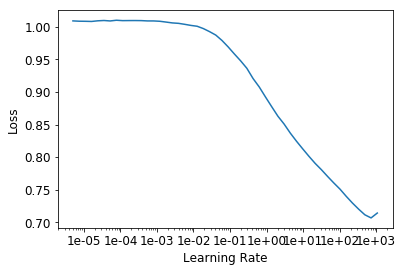

In [85]:
learn_combined.recorder.plot()

Insert callback for `Early Stopping` if validation loss does not improve by `min_delta` (0.01) over `patience`(1) epoch 

Insert another callback for saving model after every epoch. These models will be used for **PCA Analysis**

In [86]:
learn_combined.callback_fns.append(partial(EarlyStoppingCallback, monitor='val_loss', min_delta=0.01, patience=1))
learn_combined.callback_fns.append(partial(SaveModelCallback, monitor='val_loss', every='epoch', name='resnet34-awa2-stage-2a-epochs'))

epoch,train_loss,valid_loss
1,0.327485,0.351653
2,0.343293,0.346864
3,0.306278,0.282270
4,0.264266,0.233158
5,0.247364,0.208954


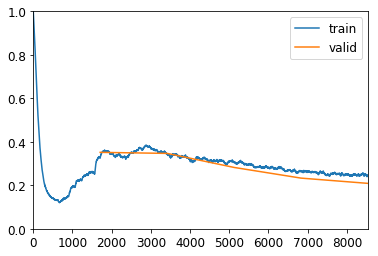

In [87]:
learn_combined.fit_one_cycle(5, slice(1e-1))

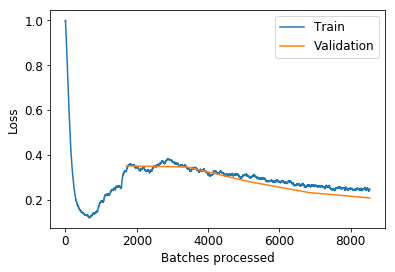

In [88]:
learn_combined.recorder.plot_losses()

### Save the model

In [89]:
learn_combined.save('resnet34-awa2-stage-2a')

### Stage 2b: Unfreeze backbone and fine tune the model

In [90]:
learn_combined.unfreeze()

In [91]:
learn_combined.callback_fns

[fastai.basic_train.Recorder,
 fastai.train.BnFreeze,
 fastai.train.ShowGraph,
 functools.partial(<class 'fastai.callbacks.tracker.EarlyStoppingCallback'>, monitor='val_loss', min_delta=0.01, patience=1),
 functools.partial(<class 'fastai.callbacks.tracker.SaveModelCallback'>, monitor='val_loss', every='epoch', name='resnet34-awa2-stage-2a-epochs')]

In [92]:
learn_combined.callback_fns.pop()

functools.partial(<class 'fastai.callbacks.tracker.SaveModelCallback'>, monitor='val_loss', every='epoch', name='resnet34-awa2-stage-2a-epochs')

In [93]:
learn_combined.callback_fns.pop()

functools.partial(<class 'fastai.callbacks.tracker.EarlyStoppingCallback'>, monitor='val_loss', min_delta=0.01, patience=1)

In [94]:
learn_combined.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


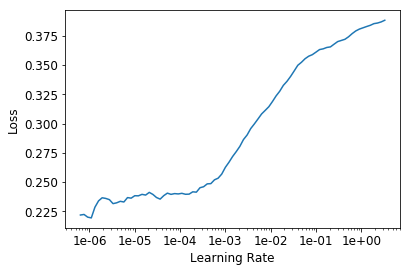

In [95]:
learn_combined.recorder.plot()

In [96]:
learn_combined.callback_fns.append(partial(EarlyStoppingCallback, monitor='val_loss', min_delta=0.001, patience=2))
learn_combined.callback_fns.append(partial(SaveModelCallback, monitor='val_loss', every='epoch', name='resnet34-awa2-stage-2b-epochs'))

epoch,train_loss,valid_loss
1,0.235055,0.204904
2,0.244813,0.200920
3,0.235995,0.199893


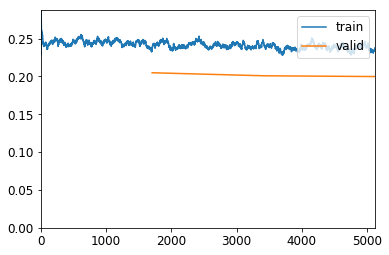

In [97]:
learn_combined.fit_one_cycle(3, slice(1e-6, 1e-4))

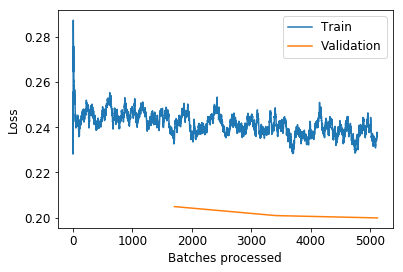

In [98]:
learn_combined.recorder.plot_losses()

In [99]:
learn_combined.freeze()

### Save the model

In [100]:
learn_combined.save('resnet34-awa2-stage-2b')

## 4.3 Model Predictions

### Load model and make predictions

In [54]:
learn_combined.load('resnet34-awa2-stage-2b')

Learner(data=ImageDataBunch;

Train: LabelList
y: FloatList (27322 items)
[FloatItem [-0.2250710278749466, -0.15674959123134613, -0.5158546566963196, 0.0836247056722641, -0.08332619071006775, -0.3474692702293396, 0.17878687381744385, -0.07311393320560455, 0.40145596861839294, 0.05146363005042076, 0.41777828335762024, 0.04084528237581253, 0.19948039948940277, -0.5551471710205078, 0.011590533889830112, 0.2590152323246002, -0.10557948052883148, 0.21340644359588623, -0.4609827697277069, 0.18470248579978943, -0.32966348528862, 0.46347105503082275, 0.03294726833701134, -0.10165330022573471, 0.23562383651733398, -0.007722075097262859, -0.1347125917673111, 0.16790570318698883, 0.06482983380556107, -0.37938830256462097, 0.0347742959856987, 0.44446277618408203, -0.5043357014656067, 0.1440601795911789, 0.1844012588262558, -0.11788546293973923, -0.0749538466334343, -0.30834364891052246, 0.3846855163574219, -0.30360764265060425, -0.1029171496629715, 0.1181022897362709, -0.3211665749549866, 0.501433

In [101]:
learn_combined.summary()

Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [16, 64, 112, 112]   9408       False     
______________________________________________________________________
BatchNorm2d          [16, 64, 112, 112]   128        True      
______________________________________________________________________
ReLU                 [16, 64, 112, 112]   0          False     
______________________________________________________________________
MaxPool2d            [16, 64, 56, 56]     0          False     
______________________________________________________________________
Conv2d               [16, 64, 56, 56]     36864      False     
______________________________________________________________________
BatchNorm2d          [16, 64, 56, 56]     128        True      
______________________________________________________________________
ReLU                 [16, 64, 56, 56]     0          False     
______________________________________________________________

In [55]:
predictions = learn_combined.get_preds()

In [56]:
pred_wv = predictions[0].numpy()
ground_wv = predictions[1].numpy()

## 4.4 PCA Decomposition

In [57]:
pred_norm = np.linalg.norm(pred_wv, axis = 1)
pred_norm = pred_norm.reshape(pred_wv.shape[0],1)

In [58]:
pred_normalized = pred_wv/pred_norm

In [59]:
pred_normalized.shape

(3015, 300)

In [60]:
ground_norm = np.linalg.norm(ground_wv, axis = 1)
ground_norm = ground_norm.reshape(ground_wv.shape[0],1)

In [61]:
ground_normalized = ground_wv/ground_norm

In [62]:
def get_normalized_embeddings(categories):
    sub_preds = []
    sub_ground = []
    labels = []
    for item in categories:
        for counter in range(len(valid_images)):
            if valid_images[counter].parts[-2].replace("+", "_") == item:
                sub_preds.append(pred_normalized[counter])
                sub_ground.append(ground_normalized[counter])
                labels.append(item)
    return np.stack(sub_preds), np.stack(sub_ground), labels            

In [63]:
true_labels = ['elephant', 'horse', 'lion', 'zebra']
pp, gg, ll =  get_normalized_embeddings(true_labels)

In [64]:
def get_cmap(n, name='tab20b'):
    return plt.cm.get_cmap(name, n)

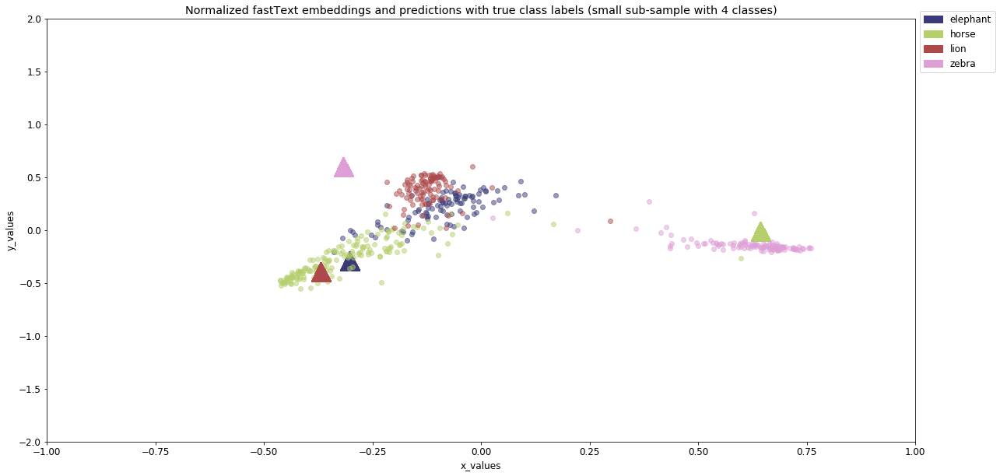

In [65]:
from sklearn.decomposition import PCA as sklearnPCA
import matplotlib.patches as mpatches


sklearn_pca = sklearnPCA(n_components=2)
sklearn_transf_p = sklearn_pca.fit_transform(pp)
sklearn_transf_g = sklearn_pca.fit_transform(gg)

_, ax = plt.subplots(figsize=(20,10))
class_labels = true_labels
num_class_labels = len(class_labels)
cmap = get_cmap(num_class_labels)
for counter in range (pp.shape[0]):
    label=ll[counter]
    ax.plot(sklearn_transf_p[counter:counter+1,0],sklearn_transf_p[counter:counter+1,1], 'o', markersize=6, color=cmap(class_labels.index(label)), alpha=0.5)
    ax.plot(sklearn_transf_g[counter:counter+1,0],sklearn_transf_g[counter:counter+1,1], '^', markersize=25, color=cmap(class_labels.index(label)), alpha=0.5)
    counter = counter+1

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.xlim([-1,1])
plt.ylim([-2,2])
plt.title('Normalized fastText embeddings and predictions with true class labels (small sub-sample with 4 classes)')
ax.legend(fontsize=12, loc='upper left', bbox_to_anchor = (1, 1.03), handles=[mpatches.Patch(color=col, label=lab) for col,lab in zip([cmap(i) for i in range(num_class_labels)],class_labels)])
plt.show()

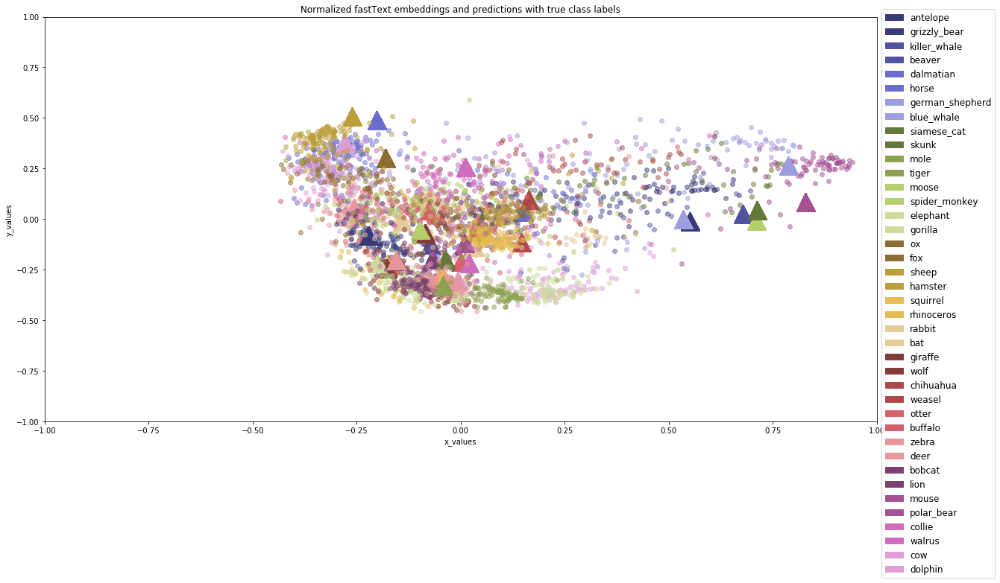

In [72]:
from sklearn.decomposition import PCA as sklearnPCA
import matplotlib.patches as mpatches


sklearn_pca = sklearnPCA(n_components=2)
sklearn_transf_p = sklearn_pca.fit_transform(pred_normalized)
sklearn_transf_g = sklearn_pca.fit_transform(ground_normalized)

_, ax = plt.subplots(figsize=(20,10))
class_labels = list(awa2_wv.keys())
num_class_labels = len(class_labels)
cmap = get_cmap(num_class_labels)
for counter in range (pred_normalized.shape[0]):
    label=valid_images[counter].parts[-2].replace("+", "_")
    ax.plot(sklearn_transf_p[counter:counter+1,0],sklearn_transf_p[counter:counter+1,1], 'o', markersize=6, color=cmap(class_labels.index(label)), alpha=0.5)
    ax.plot(sklearn_transf_g[counter:counter+1,0],sklearn_transf_g[counter:counter+1,1], '^', markersize=25, color=cmap(class_labels.index(label)), alpha=0.5)
    counter = counter+1

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.xlim([-1,1])
plt.ylim([-1,1])
plt.title('Normalized fastText embeddings and predictions with true class labels')
ax.legend(fontsize=12, loc='upper left', bbox_to_anchor = (1, 1.03), handles=[mpatches.Patch(color=col, label=lab) for col,lab in zip([cmap(i) for i in range(num_class_labels)],class_labels)])
plt.show()

# 5. Applications/ Results

## 5.1 Text to Image

In [66]:
import nmslib

def create_index(a):
    index = nmslib.init(space='angulardist')
    index.addDataPointBatch(a)
    index.createIndex()
    return index

def get_knns(index, vecs):
     return zip(*index.knnQueryBatch(vecs, k=10, num_threads=4))

def get_knn(index, vec): return index.knnQuery(vec, k=10)

In [67]:
nn_predwv = create_index(pred_wv)

In [68]:
def show_knn(text):
    fvec = fastText_vec.get_word_vector(text)
    idxs,dists = get_knn(nn_predwv, fvec)
    show_all([data_combined.valid_ds[i][0] for i in idxs[:9]], 3, 3, figsize=(8, 8))

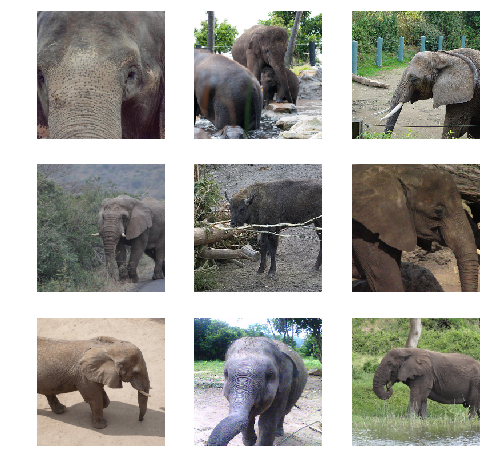

In [69]:
show_knn('ivory')

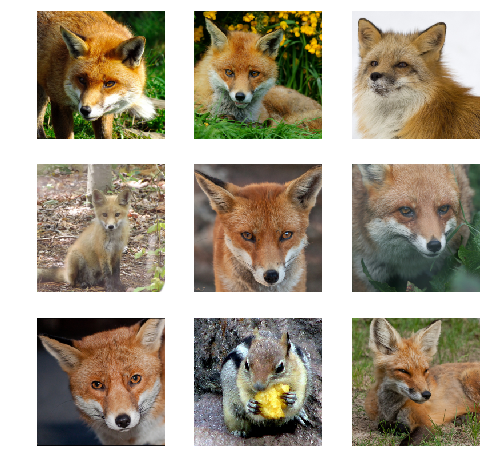

In [70]:
show_knn('news')

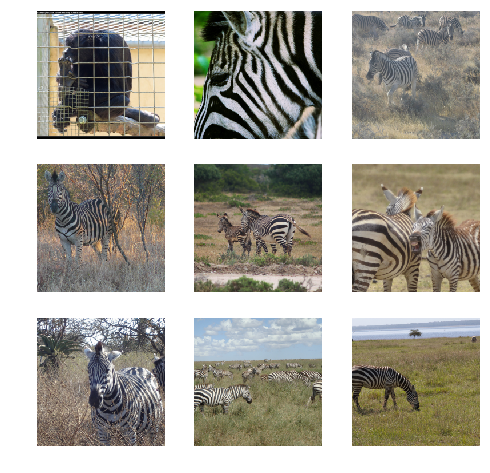

In [71]:
show_knn('stripes')

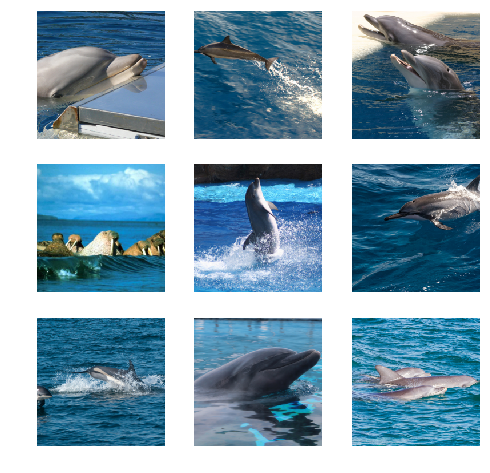

In [72]:
show_knn('ocean')

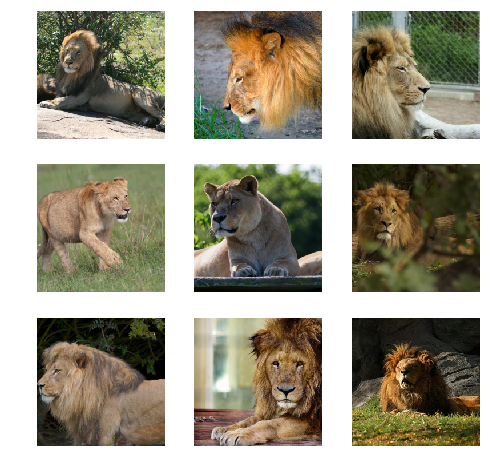

In [73]:
show_knn('king')

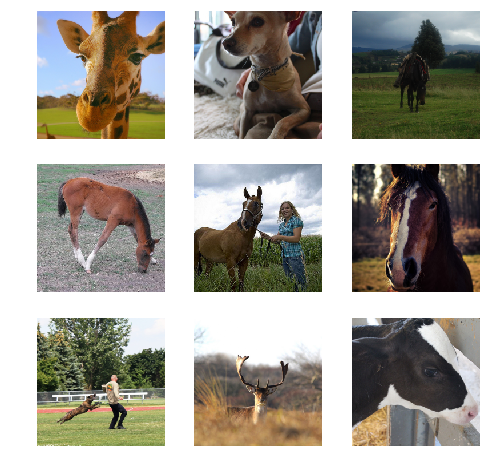

In [75]:
idxs,_ = get_knn(nn_predwv, (fastText_vec.get_word_vector('long') + fastText_vec.get_word_vector('neck'))/2)
show_all([data_combined.valid_ds[i][0] for i in idxs[:9]], 3, 3, figsize=(8, 8))

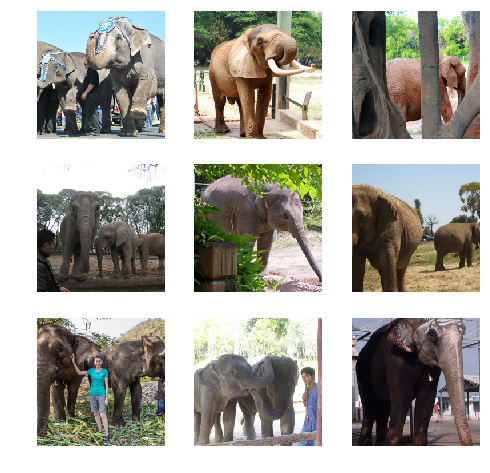

In [76]:
idxs,_ = get_knn(nn_predwv, (fastText_vec.get_word_vector('elephant') + fastText_vec.get_word_vector('horse'))/2)
show_all([data_combined.valid_ds[i][0] for i in idxs[:9]], 3, 3, figsize=(8, 8))

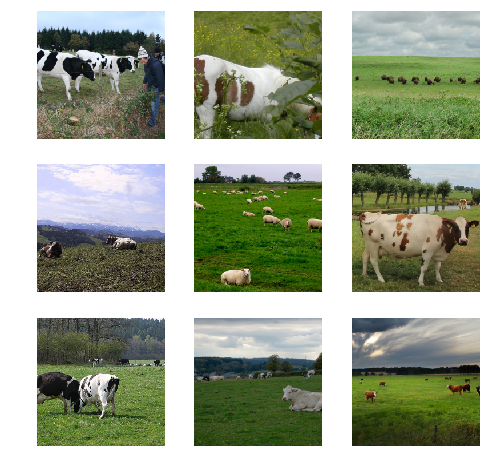

In [77]:
show_knn('milk')

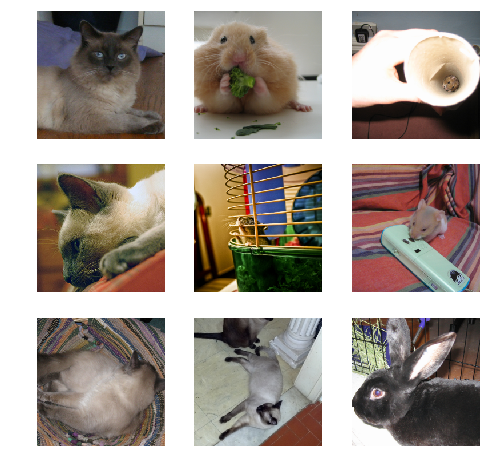

In [78]:
show_knn('computer')

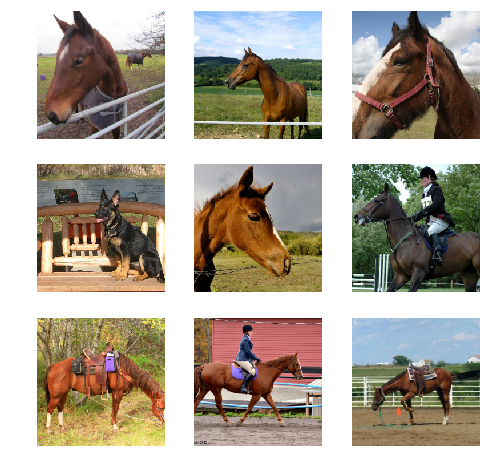

In [80]:
show_knn('race')

## 5.2 Image -> Image

In [81]:
nn_predwv = create_index(pred_wv)

In [82]:
def show_knn_img(fvec):
    idxs,dists = get_knn(nn_predwv, fvec)
    show_all([data_combined.valid_ds[i][0] for i in idxs[:9]], 3, 3, figsize=(8, 8))

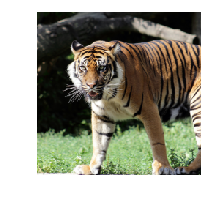

In [83]:
img, ground_p = data_combined.valid_ds[3014]
img.show()

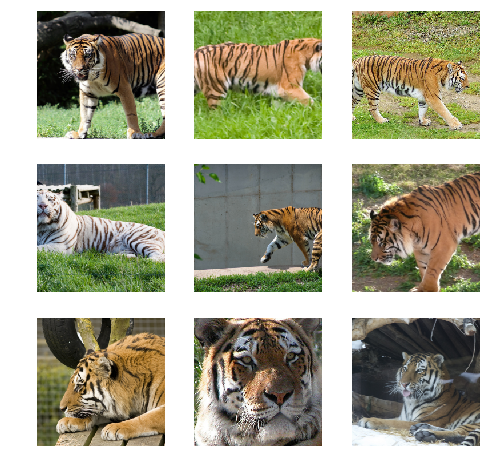

In [84]:
show_knn_img(pred_wv[3014])

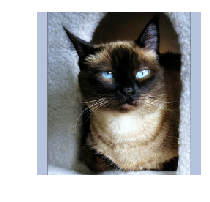

In [85]:
img, ground_p = data_combined.valid_ds[1834]
img.show()

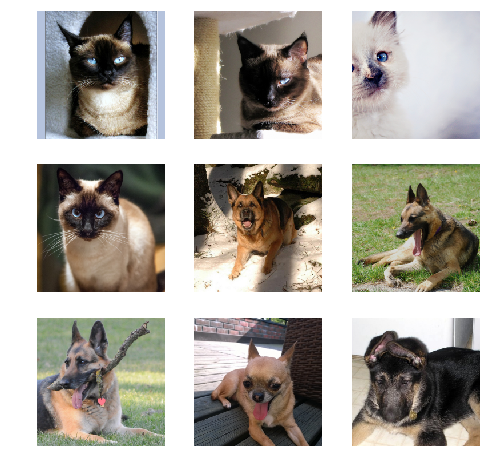

In [86]:
 show_knn_img(pred_wv[1834])

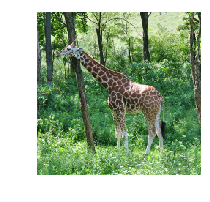

In [87]:
img, ground_p = data_combined.valid_ds[332]
img.show()

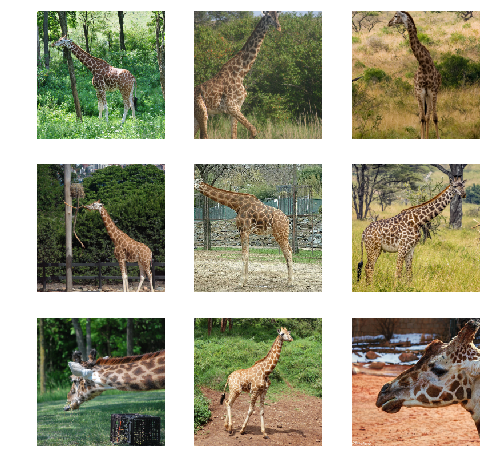

In [88]:
 show_knn_img(pred_wv[332])

## 5.3 Image->Text

In [89]:
def show_images(start):
    show_all([data_combined.valid_ds[i][0] for i in range(start,start+180,20)], 3, 3, figsize=(8, 8))

In [90]:
def true_test(start):
    return [valid_images[i].parts[-2].replace("+", "_") for i in range(start, start+180, 20)]

In [91]:
nn_groundwv = create_index(np.array(list(awa2_wv.values())))

In [96]:
gclass_40 = list(awa2_wv.keys())
newlist = []

def showimg_to_text(start):
    idxs,dists = get_knns(nn_groundwv, pred_wv)
    for i in range(start,start+180,20):
        newlist.append([gclass_40[id] for id in idxs[i][:6]])
    return newlist

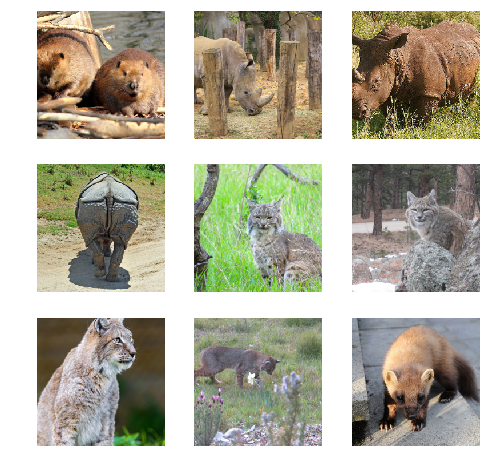

In [97]:
show_images(10)

In [98]:
true_test(10)

['beaver',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'bobcat',
 'bobcat',
 'bobcat',
 'bobcat',
 'weasel']

In [99]:
showimg_to_text(10)

[['squirrel', 'grizzly_bear', 'bobcat', 'lion', 'wolf', 'deer'],
 ['elephant', 'rhinoceros', 'deer', 'antelope', 'cow', 'sheep'],
 ['elephant', 'rhinoceros', 'antelope', 'lion', 'deer', 'cow'],
 ['deer', 'rhinoceros', 'antelope', 'elephant', 'giraffe', 'zebra'],
 ['rabbit', 'squirrel', 'deer', 'bobcat', 'skunk', 'moose'],
 ['bobcat', 'squirrel', 'rabbit', 'deer', 'skunk', 'otter'],
 ['bobcat', 'squirrel', 'rabbit', 'skunk', 'deer', 'beaver'],
 ['deer', 'moose', 'antelope', 'beaver', 'buffalo', 'rabbit'],
 ['grizzly_bear',
  'polar_bear',
  'killer_whale',
  'german_shepherd',
  'spider_monkey',
  'blue_whale']]

### Top K Tests (valid set)

In [100]:
gclass_40 = list(awa2_wv.keys())
nn_groundwv = create_index(np.array(list(awa2_wv.values())))

def topk(true_labels,k):
    newlist = []
    idxs,dists = get_knns(nn_groundwv, pred_wv)
    for i in range(pred_wv.shape[0]):
        true_val = true_labels[i].parts[-2].replace("+", "_")
        pred_k_labels = [gclass_40[id] for id in idxs[i][:k]]
        if true_val in pred_k_labels:
            newlist.append((i,true_val))
    return newlist

In [101]:
top_10 = topk(valid_images,10)
len(top_10)

2689

In [102]:
top_5 = topk(valid_images,5)
len(top_5)

2508

In [103]:
top_3 = topk(valid_images,3)
len(top_3)

2342

In [104]:
top_1 = topk(valid_images,1)
len(top_1)

1863

In [105]:
len(valid_images)

3015

### Top k by class (valid set)

In [125]:
def accuracy(tuple):
    av = 0
    for _,tot, corr in tuple:
        av = av + corr/tot
    return av/40

In [126]:
gclass_40 = list(awa2_wv.keys())
nn_groundwv = create_index(np.array(list(awa2_wv.values())))

def topk_by_class(true_labels,k):
    newlist = []
    idxs,dists = get_knns(nn_groundwv, pred_wv)
    for cls in list(awa2_wv.keys()):
        total = 0
        correct = 0
        for i in range(pred_wv.shape[0]):
            true_val = true_labels[i].parts[-2].replace("+", "_")
            if (true_val == cls):
                total = total + 1
                pred_k_labels = [gclass_40[id] for id in idxs[i][:k]]
                if true_val in pred_k_labels:
                    correct = correct+1
        newlist.append((cls, total, correct))
    return newlist

In [127]:
res = topk_by_class(valid_images,1)
res

[('antelope', 104, 69),
 ('grizzly_bear', 85, 44),
 ('killer_whale', 29, 8),
 ('beaver', 19, 0),
 ('dalmatian', 54, 50),
 ('horse', 164, 106),
 ('german_shepherd', 103, 42),
 ('blue_whale', 17, 6),
 ('siamese_cat', 50, 0),
 ('skunk', 18, 0),
 ('mole', 10, 0),
 ('tiger', 87, 78),
 ('moose', 70, 27),
 ('spider_monkey', 29, 0),
 ('elephant', 103, 90),
 ('gorilla', 87, 80),
 ('ox', 72, 24),
 ('fox', 66, 2),
 ('sheep', 142, 116),
 ('hamster', 77, 42),
 ('squirrel', 120, 104),
 ('rhinoceros', 69, 11),
 ('rabbit', 108, 93),
 ('bat', 38, 0),
 ('giraffe', 120, 113),
 ('wolf', 58, 3),
 ('chihuahua', 56, 8),
 ('weasel', 27, 0),
 ('otter', 75, 52),
 ('buffalo', 89, 61),
 ('zebra', 117, 115),
 ('deer', 134, 112),
 ('bobcat', 63, 27),
 ('lion', 101, 88),
 ('mouse', 18, 0),
 ('polar_bear', 86, 71),
 ('collie', 102, 54),
 ('walrus', 21, 0),
 ('cow', 133, 85),
 ('dolphin', 94, 82)]

In [128]:
accuracy(res)

0.47446801399767685

Create dataframe

In [133]:
import matplotlib
matplotlib.rcParams.update({'font.size':12})

In [134]:
df_valid = pd.DataFrame(res, columns=['class','total', 'correct'])
df_valid = df_valid.set_index(['class'])

In [135]:
df_valid = df_valid.sort_values(by='total', ascending=False)

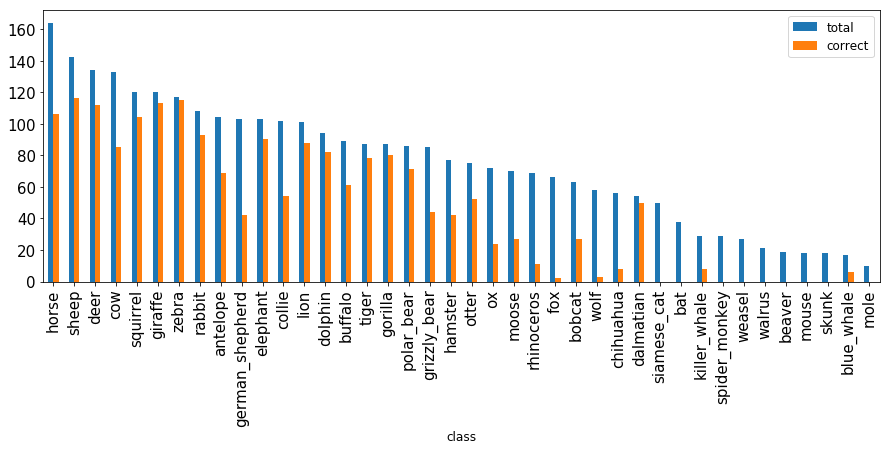

In [136]:
ax = df_valid.plot.bar(rot=90, fontsize=15, figsize=(15,5))

Alternate definition, outputs false predictions

In [137]:
gclass_40 = list(awa2_wv.keys())
nn_groundwv = create_index(np.array(list(awa2_wv.values())))

def topk_by_class_e(true_labels,k):
    newlist = []
    idxs,dists = get_knns(nn_groundwv, pred_wv)
    for cls in list(awa2_wv.keys()):
        total = 0
        correct = 0
        for i in range(pred_wv.shape[0]):
            true_val = true_labels[i].parts[-2].replace("+", "_")
            if (true_val == cls):
                total = total + 1
                pred_k_labels = [gclass_40[id] for id in idxs[i][:k]]
                if true_val in pred_k_labels:
                    correct = correct+1
        newlist.append((cls, total, total-correct))
    return newlist

In [138]:
res2 = topk_by_class_e(valid_images,1)
res2

[('antelope', 104, 35),
 ('grizzly_bear', 85, 41),
 ('killer_whale', 29, 21),
 ('beaver', 19, 19),
 ('dalmatian', 54, 4),
 ('horse', 164, 58),
 ('german_shepherd', 103, 61),
 ('blue_whale', 17, 11),
 ('siamese_cat', 50, 50),
 ('skunk', 18, 18),
 ('mole', 10, 10),
 ('tiger', 87, 9),
 ('moose', 70, 43),
 ('spider_monkey', 29, 29),
 ('elephant', 103, 13),
 ('gorilla', 87, 7),
 ('ox', 72, 48),
 ('fox', 66, 64),
 ('sheep', 142, 26),
 ('hamster', 77, 35),
 ('squirrel', 120, 16),
 ('rhinoceros', 69, 58),
 ('rabbit', 108, 15),
 ('bat', 38, 38),
 ('giraffe', 120, 7),
 ('wolf', 58, 55),
 ('chihuahua', 56, 48),
 ('weasel', 27, 27),
 ('otter', 75, 23),
 ('buffalo', 89, 28),
 ('zebra', 117, 2),
 ('deer', 134, 22),
 ('bobcat', 63, 36),
 ('lion', 101, 13),
 ('mouse', 18, 18),
 ('polar_bear', 86, 15),
 ('collie', 102, 48),
 ('walrus', 21, 21),
 ('cow', 133, 48),
 ('dolphin', 94, 12)]

In [139]:
df_valid_err = pd.DataFrame(res2, columns=['class','total', 'false_pred'])
df_valid_err = df_valid_err.set_index(['class'])

In [140]:
df_valid_err = df_valid_err.sort_values(by='total', ascending=False)

Text(0,0.5,'Number of images per class')

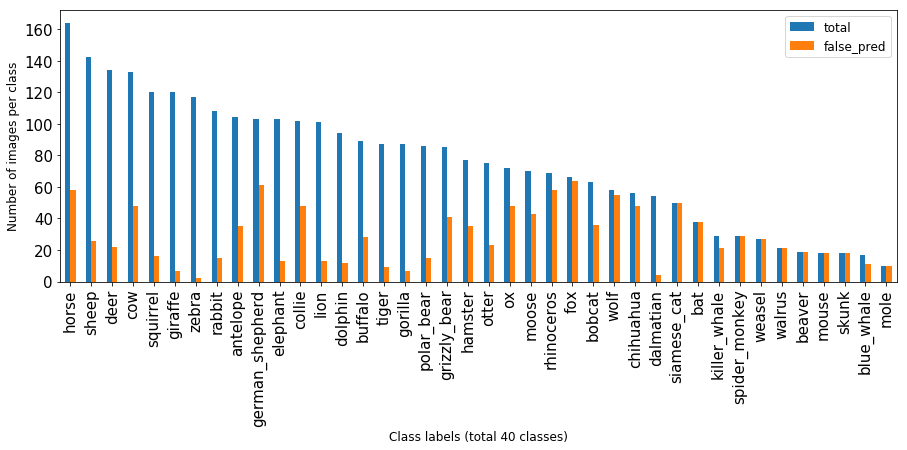

In [141]:
ax = df_valid_err.plot.bar(rot=90, fontsize=15, figsize=(15,5))
ax.set_xlabel("Class labels (total 40 classes)")
ax.set_ylabel("Number of images per class")

# 6.Test Set Explorations

In [142]:
test_images = []
def get_test_labels(i):
    item = awa2_all_wv.get(i.parts[-2].replace("+", "_"))
    if(i.parts[-3] == 'test'):
        test_images.append(i)
    return item

In [143]:
data_combined_test = (ImageItemList.from_folder(path)
                    .split_by_folder(train='train', valid='test')
                    .label_from_func(get_test_labels, label_cls=FloatList)
                    .transform(get_transforms(), size=224)
                    .databunch(bs=16))
data_combined_test.normalize(imagenet_stats)

ImageDataBunch;

Train: LabelList
y: FloatList (27322 items)
[FloatItem [-0.2250710278749466, -0.15674959123134613, -0.5158546566963196, 0.0836247056722641, -0.08332619071006775, -0.3474692702293396, 0.17878687381744385, -0.07311393320560455, 0.40145596861839294, 0.05146363005042076, 0.41777828335762024, 0.04084528237581253, 0.19948039948940277, -0.5551471710205078, 0.011590533889830112, 0.2590152323246002, -0.10557948052883148, 0.21340644359588623, -0.4609827697277069, 0.18470248579978943, -0.32966348528862, 0.46347105503082275, 0.03294726833701134, -0.10165330022573471, 0.23562383651733398, -0.007722075097262859, -0.1347125917673111, 0.16790570318698883, 0.06482983380556107, -0.37938830256462097, 0.0347742959856987, 0.44446277618408203, -0.5043357014656067, 0.1440601795911789, 0.1844012588262558, -0.11788546293973923, -0.0749538466334343, -0.30834364891052246, 0.3846855163574219, -0.30360764265060425, -0.1029171496629715, 0.1181022897362709, -0.3211665749549866, 0.5014338493347168, 0

In [144]:
test_images

[PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10864.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10348.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10014.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10547.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10946.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10862.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10239.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10823.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10609.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10231.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10939.jpg'),
 PosixPath('/home/nik/data/Animals_with_Attributes2/test/seal/seal_10605.jpg'),
 PosixPath('/home/nik/data/Animals_with_

In [155]:
learn_combined.data = data_combined_test

In [156]:
data_combined_test.valid_ds

LabelList
y: FloatList (6985 items)
[FloatItem [-0.048362549394369125, 0.41502758860588074, -0.10246674716472626, 0.04748367890715599, -0.5290834307670593, 0.26411065459251404, -0.21428464353084564, 0.10311979055404663, 0.0716925784945488, -0.2178933024406433, -0.268927663564682, 0.032720573246479034, -0.09500464797019958, -0.13007862865924835, -0.07281839847564697, -0.08307193964719772, -0.08293391764163971, 0.3671732544898987, 0.08069787174463272, 0.07382667064666748, -0.4746110439300537, 0.1278471052646637, 0.11018344014883041, -0.1842723786830902, -0.25679612159729004, 0.1843162477016449, 0.09878458082675934, 0.01351855043321848, -0.4000028371810913, 0.31089675426483154, -0.24869979918003082, 0.3800945281982422, -0.0564093291759491, -0.43349453806877136, 0.10859082639217377, 0.07388095557689667, 0.23238533735275269, -0.3959181308746338, -0.1177465096116066, -0.4943293035030365, 0.21573767066001892, -0.01655547320842743, 0.09586352109909058, -0.01726202666759491, 0.4261094033718109,

In [157]:
predictions_test = learn_combined.get_preds()

In [158]:
pred_test_wv = predictions_test[0].numpy()
pred_test_wv.shape

(6985, 300)

In [159]:
gclass = list(awa2_all_wv.keys())

In [160]:
gvecs = list(awa2_all_wv.values())
gvecs = np.array(gvecs)

## 6.1 Image-> Image

In [161]:
nn_predtestwv = create_index(pred_test_wv)

In [162]:
def show_knn_img(fvec):
    idxs,dists = get_knn(nn_predtestwv, fvec)
    show_all([data_combined_test.valid_ds[i][0] for i in idxs[:9]], 3, 3, figsize=(8, 8))

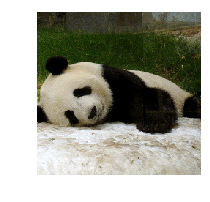

In [163]:
img, ground_p = data_combined_test.valid_ds[4500]
img.show()

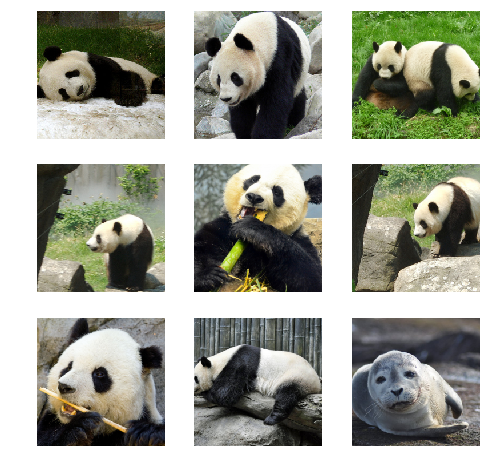

In [164]:
show_knn_img(pred_test_wv[4500])

## 6.2 Image->Text

In [173]:
def show_images(start):
    show_all([data_combined_test.valid_ds[i][0] for i in range(start,start+6300,700)], 3, 3, figsize=(8, 8))

In [174]:
def true_test(start):
    return [test_images[i].parts[-2].replace("+", "_") for i in range(start, start+6300, 700)]

In [175]:
nn_groundtestwv = create_index(np.array(list(awa2_all_wv.values())))
gclass = list(awa2_all_wv.keys())

newlist = []
def showimg_to_text(start):
    idxs,dists = get_knns(nn_groundtestwv, pred_test_wv)
    for i in range(start,start+6300,700):
        newlist.append([gclass[id] for id in idxs[i][:6]])
    return newlist

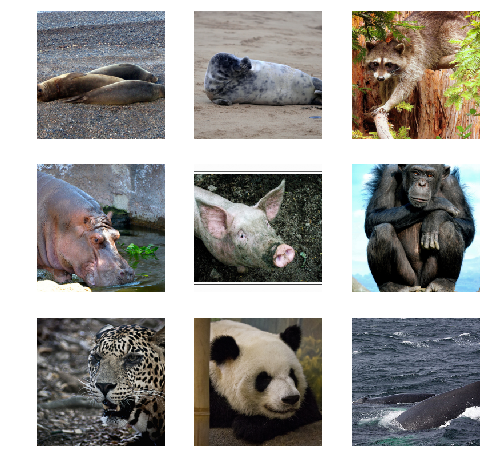

In [176]:
show_images(10)

In [177]:
true_test(10)

['seal',
 'seal',
 'raccoon',
 'hippopotamus',
 'pig',
 'chimpanzee',
 'leopard',
 'giant_panda',
 'humpback_whale']

In [178]:
showimg_to_text(10)

[['cow', 'sheep', 'deer', 'pig', 'antelope', 'ox'],
 ['dalmatian', 'otter', 'grizzly_bear', 'rabbit', 'bobcat', 'sheep'],
 ['deer', 'wolf', 'rabbit', 'bobcat', 'moose', 'raccoon'],
 ['deer', 'moose', 'rabbit', 'squirrel', 'raccoon', 'elephant'],
 ['rabbit', 'squirrel', 'hamster', 'raccoon', 'pig', 'deer'],
 ['gorilla', 'chimpanzee', 'zebra', 'hippopotamus', 'giraffe', 'elephant'],
 ['dalmatian', 'otter', 'rabbit', 'giraffe', 'bobcat', 'hippopotamus'],
 ['grizzly_bear',
  'polar_bear',
  'killer_whale',
  'german_shepherd',
  'spider_monkey',
  'humpback_whale'],
 ['dolphin',
  'humpback_whale',
  'blue_whale',
  'killer_whale',
  'grizzly_bear',
  'walrus']]

### Top K Tests (test set)

In [179]:
nn_groundtestwv = create_index(np.array(list(awa2_all_wv.values())))
gclass = list(awa2_all_wv.keys())

def topk_test(true_labels,k):
    newlist = []
    idxs,dists = get_knns(nn_groundtestwv, pred_test_wv)
    for i in range(pred_test_wv.shape[0]):
        true_val = true_labels[i].parts[-2].replace("+", "_")
        pred_k_labels = [gclass[id] for id in idxs[i][:k]]
        if true_val in pred_k_labels:
            newlist.append((i,true_val))
    return newlist

In [180]:
top_10_test = topk_test(test_images,10)
len(top_10_test)

2954

In [181]:
top_5_test = topk_test(test_images,5)
len(top_5_test)

1853

In [182]:
top_3_test = topk_test(test_images,3)
len(top_3_test)

1121

In [183]:
top_1_test = topk_test(test_images,1)
len(top_1_test)

47

In [184]:
len(test_images)

6985

### Top k by class (test set)

In [185]:
nn_groundtestwv = create_index(np.array(list(awa2_all_wv.values())))
gclass = list(awa2_all_wv.keys())

def topk_by_class(true_labels,k):
    newlist = []
    idxs,dists = get_knns(nn_groundtestwv, pred_test_wv)
    for cls in list(awa2_all_wv.keys()):
        total = 0
        correct = 0
        for i in range(pred_test_wv.shape[0]):
            true_val = true_labels[i].parts[-2].replace("+", "_")
            if (true_val == cls):
                total = total + 1
                pred_k_labels = [gclass[id] for id in idxs[i][:k]]
                if true_val in pred_k_labels:
                    correct = correct+1
        newlist.append((cls, correct, total))
    return newlist

In [186]:
topk_by_class(test_images,5)

[('antelope', 0, 0),
 ('grizzly_bear', 0, 0),
 ('killer_whale', 0, 0),
 ('beaver', 0, 0),
 ('dalmatian', 0, 0),
 ('persian_cat', 2, 747),
 ('horse', 0, 0),
 ('german_shepherd', 0, 0),
 ('blue_whale', 0, 0),
 ('siamese_cat', 0, 0),
 ('skunk', 0, 0),
 ('mole', 0, 0),
 ('tiger', 0, 0),
 ('hippopotamus', 83, 684),
 ('leopard', 60, 720),
 ('moose', 0, 0),
 ('spider_monkey', 0, 0),
 ('humpback_whale', 667, 709),
 ('elephant', 0, 0),
 ('gorilla', 0, 0),
 ('ox', 0, 0),
 ('fox', 0, 0),
 ('sheep', 0, 0),
 ('seal', 0, 988),
 ('chimpanzee', 303, 728),
 ('hamster', 0, 0),
 ('squirrel', 0, 0),
 ('rhinoceros', 0, 0),
 ('rabbit', 0, 0),
 ('bat', 0, 0),
 ('giraffe', 0, 0),
 ('wolf', 0, 0),
 ('chihuahua', 0, 0),
 ('rat', 97, 310),
 ('weasel', 0, 0),
 ('otter', 0, 0),
 ('buffalo', 0, 0),
 ('zebra', 0, 0),
 ('giant_panda', 1, 874),
 ('deer', 0, 0),
 ('bobcat', 0, 0),
 ('pig', 262, 713),
 ('lion', 0, 0),
 ('mouse', 0, 0),
 ('polar_bear', 0, 0),
 ('collie', 0, 0),
 ('walrus', 0, 0),
 ('raccoon', 376, 512),


In [187]:
topk_by_class(test_images,3)

[('antelope', 0, 0),
 ('grizzly_bear', 0, 0),
 ('killer_whale', 0, 0),
 ('beaver', 0, 0),
 ('dalmatian', 0, 0),
 ('persian_cat', 1, 747),
 ('horse', 0, 0),
 ('german_shepherd', 0, 0),
 ('blue_whale', 0, 0),
 ('siamese_cat', 0, 0),
 ('skunk', 0, 0),
 ('mole', 0, 0),
 ('tiger', 0, 0),
 ('hippopotamus', 18, 684),
 ('leopard', 30, 720),
 ('moose', 0, 0),
 ('spider_monkey', 0, 0),
 ('humpback_whale', 623, 709),
 ('elephant', 0, 0),
 ('gorilla', 0, 0),
 ('ox', 0, 0),
 ('fox', 0, 0),
 ('sheep', 0, 0),
 ('seal', 0, 988),
 ('chimpanzee', 267, 728),
 ('hamster', 0, 0),
 ('squirrel', 0, 0),
 ('rhinoceros', 0, 0),
 ('rabbit', 0, 0),
 ('bat', 0, 0),
 ('giraffe', 0, 0),
 ('wolf', 0, 0),
 ('chihuahua', 0, 0),
 ('rat', 0, 310),
 ('weasel', 0, 0),
 ('otter', 0, 0),
 ('buffalo', 0, 0),
 ('zebra', 0, 0),
 ('giant_panda', 0, 874),
 ('deer', 0, 0),
 ('bobcat', 0, 0),
 ('pig', 58, 713),
 ('lion', 0, 0),
 ('mouse', 0, 0),
 ('polar_bear', 0, 0),
 ('collie', 0, 0),
 ('walrus', 0, 0),
 ('raccoon', 124, 512),
 (